# Spatial mapping of cell types across the mouse brain (3/3) - visualising results and downstream analysis

## Outline

The [**cell2location** workflow](https://github.com/vitkl/cell2location_paper/blob/master/paper/FigS1_cell2location_workflow.pdf) consists of three sections:

I. Estimating reference expression signatures of cell types (1/3)

II. Spatially mapping cell types (2/3)

III. Results and downstream analysis (3/3, this notebook):

1. [Loading cell2location model output](#1.-Loading-cell2location-model-output)
2. [Visualisation of cell type locations](#2.-Visualisation-of-cell-type-locations)
3. [Automatic discrete region identification by clustering cell densities](#3.-Identifying-tissue-regions-by-clustering)
4. [Identify groups of co-located cell types using matrix factorisation (NMF)](#4.-Identify-groups-of-co-located-cell-types-using-matrix-factorisation)
5. [Pearson correlation of cell types between snRNAseq and spatial inferred data and their heatmaps](#5.-Pearson-correlation)

## Loading packages

In [1]:
import sys
import pickle
import scanpy as sc
import anndata
import numpy as np
import os

import cell2location

import matplotlib as mpl
from matplotlib import pyplot as plt

# scanpy prints a lot of warnings
import warnings
warnings.filterwarnings('ignore')

## 1. Loading cell2location model output <a name="1.-Loading-cell2location-model-output"></a>

First, let's load the cell2location results. In the export step of cell2location pipeline, cell type abundances across locations are added to `sp_data` as columns of `sp_data.obs` and all paramters of the model are exported to `sp_data.uns['mod']`. This anndata object and a csv file `W.csv` / `W_q05.csv` with cell locations are saved to the results directory. 

Normally, you would have the output on your system (e.g. by running  tutorial 2/3), however, you could also start with the output from our data portal:

In [2]:
results_folder = './results/mouse_brain_snrna/'
r = {'run_name': 'LocationModelLinearDependentWMultiExperiment_5experiments_46clusters_1866locations_14142genes'}

# defining useful function
def select_slide(adata, s, s_col='sample'):
    r""" Select data for one slide from the spatial anndata object.
    
    :param adata: Anndata object with multiple spatial samples
    :param s: name of selected sample
    :param s_col: column in adata.obs listing sample name for each location
    """
    
    slide = adata[adata.obs[s_col].isin([s]), :]
    s_keys = list(slide.uns['spatial'].keys())
    s_spatial = np.array(s_keys)[[s in k for k in s_keys]][0]

    slide.uns['spatial'] = {s_spatial: slide.uns['spatial'][s_spatial]}
    
    return slide

We load the results of the model saved into the `adata_vis` Anndata object:

In [3]:
sp_data_file = results_folder +r['run_name']+'/sp.h5ad'

adata_vis = anndata.read(sp_data_file)

Variable names are not unique. To make them unique, call `.var_names_make_unique`.


## 2. Visualisation of cell type locations <a name="2.-Visualisation-of-cell-type-locations"></a>

First, we learn how to visualise cell type locations using the standard scanpy plotting tool `sc.pl.spatial` and our custom tool that visualises several cell types in one figure using colour interpolation `cell2location.plt.mapping_video.plot_spatial`.

Cell2location estimates the absolute cell and mRNA abundance of reference cells types. For both of these measures, **5% quantile of the posterior distribution are used to visualise the results, representing the confident level of cell abundance and mRNA count.**

For completeness, for each visium section, `sc.pl.spatial` was used to produce 4 figure panels showing the locations of all cell types (cell and mRNA abundance, 5% and the mean of the posterior distribution), saved to `r['run_name']/plots/spatial/`.

Here, we visualise locations of multiple cell types in one figure using absolute cell density (5% quantile), model parameter representing this is called `q05_spot_factors`. Six neuronal and glial cell types mapping to 6 distinct regions of the mouse brain are shown.

In [4]:
from cell2location.plt.mapping_video import plot_spatial
from cell2location.cluster_averages.cluster_averages import get_cluster_averages_df
from cell2location.plt.plot_heatmap import clustermap

We first check the distribution of cell types in different sub-regions or commented area. The scale bar represents the relative cell density in region.

In [5]:
# Compute average abundance of each region cluster
ct_aver = get_cluster_averages_df(X=adata_vis.obs[['q05_spot_factors' + i 
                                                      for i in 
                                                   adata_vis.uns['mod']['fact_names']]],
                        cluster_col=adata_vis.obs["region_label"])
ct_aver.index = adata_vis.uns['mod']['fact_names']

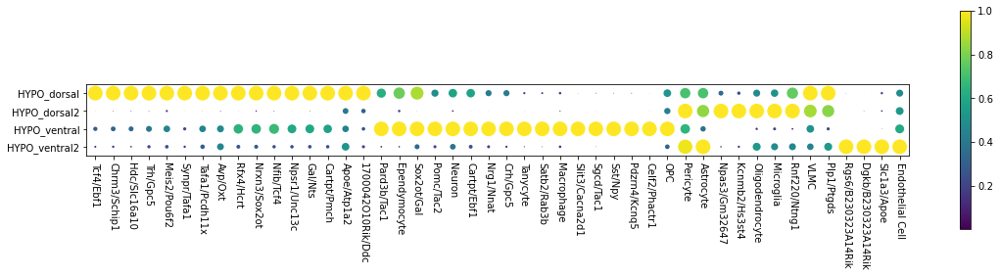

In [6]:
# normalise to get 10% of each cell type in each location
ct_aver = (ct_aver.T / ct_aver.max(1)).T
with mpl.rc_context({'axes.facecolor':  'white'}):
    clustermap(ct_aver.T, fun_type='dotplot',#.iloc[linkage['row_ord'], :],
               cmap = 'viridis',
               cluster_rows=False, cluster_cols=True, figure_size=(16, 4))
#     plt.savefig('subregion_dotplot.pdf',
#                     bbox_inches='tight', facecolor='white')

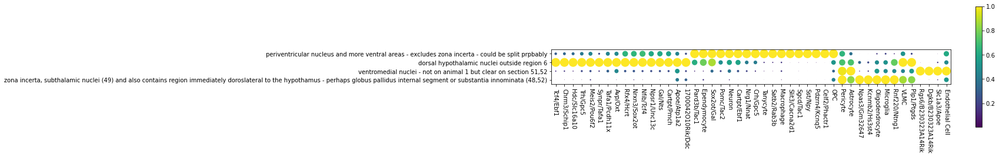

In [7]:
# Compute average abundance of each region cluster
ct_aver = get_cluster_averages_df(X=adata_vis.obs[['q05_spot_factors' + i 
                                                      for i in 
                                                   adata_vis.uns['mod']['fact_names']]],
                        cluster_col=adata_vis.obs["comments"])
ct_aver.index = adata_vis.uns['mod']['fact_names']

# normalise to get 10% of each cell type in each location
ct_aver = (ct_aver.T / ct_aver.max(1)).T
with mpl.rc_context({'axes.facecolor':  'white'}):
    clustermap(ct_aver.T, fun_type='dotplot',#.iloc[linkage['row_ord'], :],
               cmap = 'viridis',
               cluster_rows=True, cluster_cols=True, figure_size=(25, 4))
#     plt.savefig('comments_dotplot.pdf',
#                     bbox_inches='tight', facecolor='white')

list(pd.DataFrame(adata_snrna_raw.obs['group'].unique())[0])

In [11]:
sp_data = adata_vis.copy()
data_samples = sp_data.obs["sample"].unique()
clust_names_orig = ["mean_nUMI_factors" + i for i in sp_data.uns["mod"]["fact_names"]]

Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [60]:
export_args = {
    "path": fig_path,
    "plot_extension": "pdf",
    "scanpy_plot_vmax": "p99.2",
    "scanpy_plot_size": 1.3,
    "save_model": False,
    "save_spatial_plots": True,
    "run_name_suffix": "",
    "export_q05": True,
    "export_mean": False,
    "scanpy_coords_name": "spatial",
    "img_key": "hires",
}

for s in data_samples:
    sc_spatial_present = np.any(np.isin(list(sp_data.uns.keys()), ["spatial"]))
    if sc_spatial_present:
        sc.settings.figdir = fig_path + "spatial/"
        os.makedirs(fig_path + "spatial/", exist_ok=True)
        
        with mpl.rc_context({"axes.facecolor": "black"}):
            s_ind = sp_data.obs['sample'] == s
            s_keys = list(sp_data.uns["spatial"].keys())
            s_spatial = np.array(s_keys)[[s in i for i in s_keys]][0]
            
            clust_names_orig = ["q05_nUMI_factors" + i for i in sp_data.uns["mod"]["fact_names"]]
            clust_names = sp_data.uns["mod"]["fact_names"]

            sp_data.obs[clust_names] = sp_data.obs[clust_names_orig]
            fig = sc.pl.spatial(
                sp_data[s_ind, :],
                cmap="viridis",
                color=clust_names,
                ncols=5,
                library_id=s_spatial,
                size=export_args["scanpy_plot_size"],
                img_key=export_args["img_key"],
                alpha_img=0,
                vmin=0,
                vmax=export_args["scanpy_plot_vmax"],
                show=False,
                return_fig=True,
            )
            plt.savefig(
                f"{fig_path}/spatial/W_mRNA_count_q05_{s}_{export_args['scanpy_plot_vmax']}"
                f".{export_args['plot_extension']}",
                bbox_inches="tight",
                format = 'pdf'
            )
            # fig.clear()
            plt.close()

            fig = sc.pl.spatial(
                sp_data[s_ind, :],
                cmap="viridis",
                color=clust_names,
                ncols=5,
                library_id=s_spatial,
                size=export_args["scanpy_plot_size"],
                img_key=export_args["img_key"],
                alpha_img=1,
                vmin=0,
                vmax=export_args["scanpy_plot_vmax"],
                show=False,
                return_fig=True,
            )
            plt.savefig(
                f"{fig_path}/spatial/histo_W_mRNA_count_q05_{s}_{export_args['scanpy_plot_vmax']}"
                f".{export_args['plot_extension']}",
                bbox_inches="tight",
                format = 'pdf'
            )
            # fig.clear()
            plt.close()

            # Visualize cell type locations #####
            # making copy to transform to log & assign nice names
            clust_names_orig = ["q05_spot_factors" + i for i in sp_data.uns["mod"]["fact_names"]]
            clust_names = sp_data.uns["mod"]["fact_names"]
            sp_data.obs[clust_names] = sp_data.obs[clust_names_orig]

            fig = sc.pl.spatial(
                sp_data[s_ind, :],
                cmap="viridis",
                color=clust_names,
                ncols=5,
                library_id=s_spatial,
                size=export_args["scanpy_plot_size"],
                img_key=export_args["img_key"],
                alpha_img=0,
                vmin=0,
                vmax=export_args["scanpy_plot_vmax"],
                show=False,
                return_fig=True,
            )
            plt.savefig(
                f"{fig_path}/spatial/W_cell_density_q05_{s}_{export_args['scanpy_plot_vmax']}"
                f".{export_args['plot_extension']}",
                bbox_inches="tight",
                format = 'pdf'
            )
            # fig.clear()
            plt.close()

            fig = sc.pl.spatial(
                sp_data[s_ind, :],
                cmap="viridis",
                color=clust_names,
                ncols=5,
                library_id=s_spatial,
                size=export_args["scanpy_plot_size"],
                img_key=export_args["img_key"],
                alpha_img=1,
                vmin=0,
                vmax=export_args["scanpy_plot_vmax"],
                show=False,
                return_fig=True,
            )
            plt.savefig(
                f"{fig_path}/spatial/histo_W_cell_density_q05_{s}_{export_args['scanpy_plot_vmax']}"
                f".{export_args['plot_extension']}",
                bbox_inches="tight",
                format = 'pdf'
            )
            # fig.clear()
            plt.close()
            

Trying to set attribute `.uns` of view, copying.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


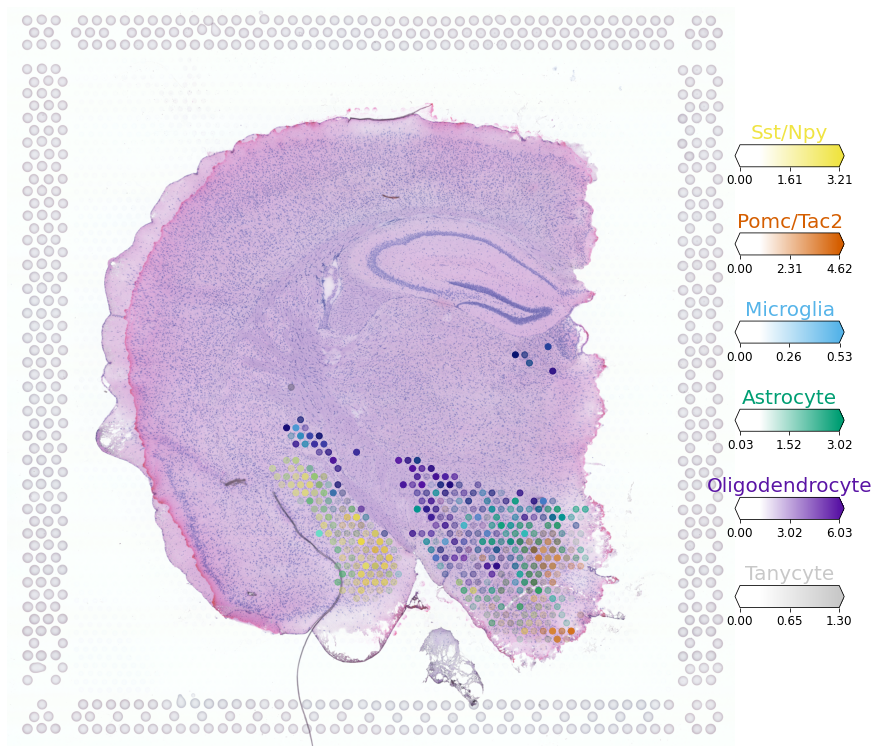

In [13]:
# select up to 6 clusters 
sel_clust = [ 'Sst/Npy','Pomc/Tac2','Microglia', 'Astrocyte', 'Oligodendrocyte', 'Tanycyte']
sel_clust_col = ['q05_spot_factors' + str(i) for i in sel_clust]

slide = select_slide(adata_vis, 'ST8059048')

with mpl.rc_context({'figure.figsize': (15, 15)}):
    fig = plot_spatial(slide.obs[sel_clust_col], labels=sel_clust,
                  coords=slide.obsm['spatial'] \
                          * list(slide.uns['spatial'].values())[0]['scalefactors']['tissue_hires_scalef'], 
                  show_img=True, img_alpha=0.8,
                  style='fast', # fast or dark_background
                  img=list(slide.uns['spatial'].values())[0]['images']['hires'],
                  circle_diameter=6, colorbar_position='right')
# fig.savefig("arc_HEslide_48.pdf")

Trying to set attribute `.uns` of view, copying.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


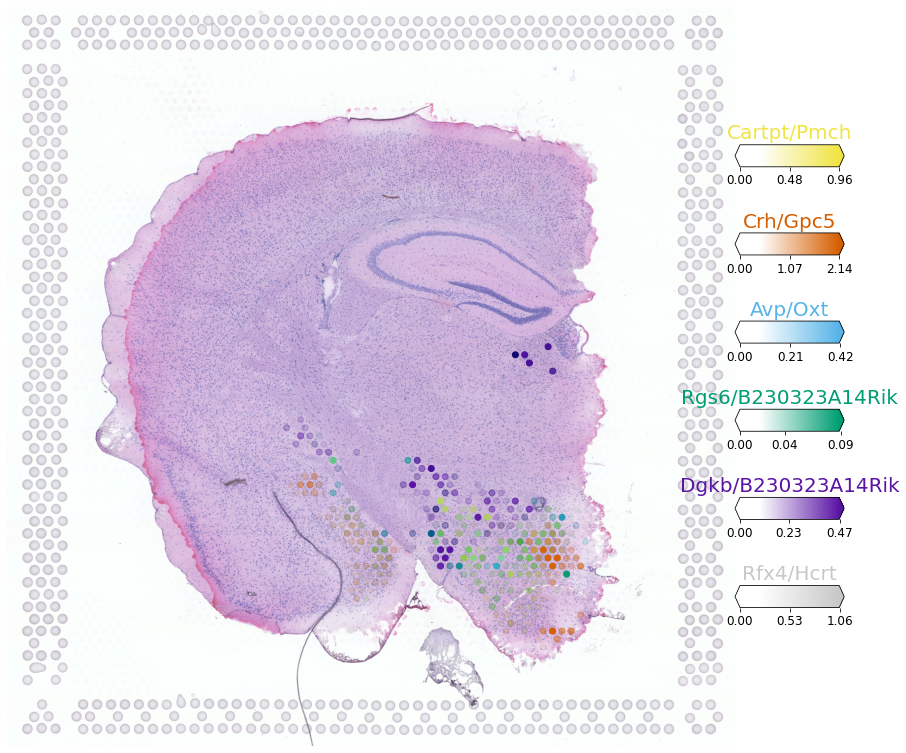

In [14]:
from cell2location.plt.mapping_video import plot_spatial

# select up to 6 clusters 
sel_clust = [ 'Cartpt/Pmch','Crh/Gpc5','Avp/Oxt', 'Rgs6/B230323A14Rik', 'Dgkb/B230323A14Rik', 'Rfx4/Hcrt']
sel_clust_col = ['q05_spot_factors' + str(i) for i in sel_clust]

slide = select_slide(adata_vis, 'ST8059048')

with mpl.rc_context({'figure.figsize': (15, 15)}):
    fig = plot_spatial(slide.obs[sel_clust_col], labels=sel_clust,
                  coords=slide.obsm['spatial'] \
                          * list(slide.uns['spatial'].values())[0]['scalefactors']['tissue_hires_scalef'], 
                  show_img=True, img_alpha=0.8,
                  style='fast', # fast or dark_background
                  img=list(slide.uns['spatial'].values())[0]['images']['hires'],
                  circle_diameter=6, colorbar_position='right')
# fig.savefig("rest_HEslide_48.pdf")

We can produce this visualisation in dark background by setting `style='dark_background'` and hiding the image `img_alpha=0`.

Trying to set attribute `.uns` of view, copying.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


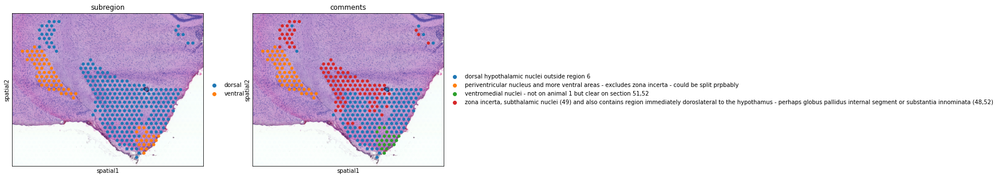

In [15]:
slide = select_slide(adata_vis, 'ST8059051')

with mpl.rc_context({'figure.figsize': [6,7],
                     'axes.facecolor': 'white'}):
    sc.pl.spatial(slide, img_key = "hires", cmap='magma', 
                  library_id=list(slide.uns['spatial'].keys())[0],
                  color=['subregion', 'comments'], size=1,
                  gene_symbols='SYMBOL', show=False, return_fig=True)

Now, we compare the cell abundance estimates (above) to the estimated mRNA abundance from each cell type. This is often useful for indentifying which cell types did not map to a particular tissue (see [paper Fig S6](https://www.biorxiv.org/content/10.1101/2020.11.15.378125v1.supplementary-material), mRNA count < 50 - note max value on the color bars), model parameter representing this is called `q05_nUMI_factors`.

Trying to set attribute `.uns` of view, copying.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


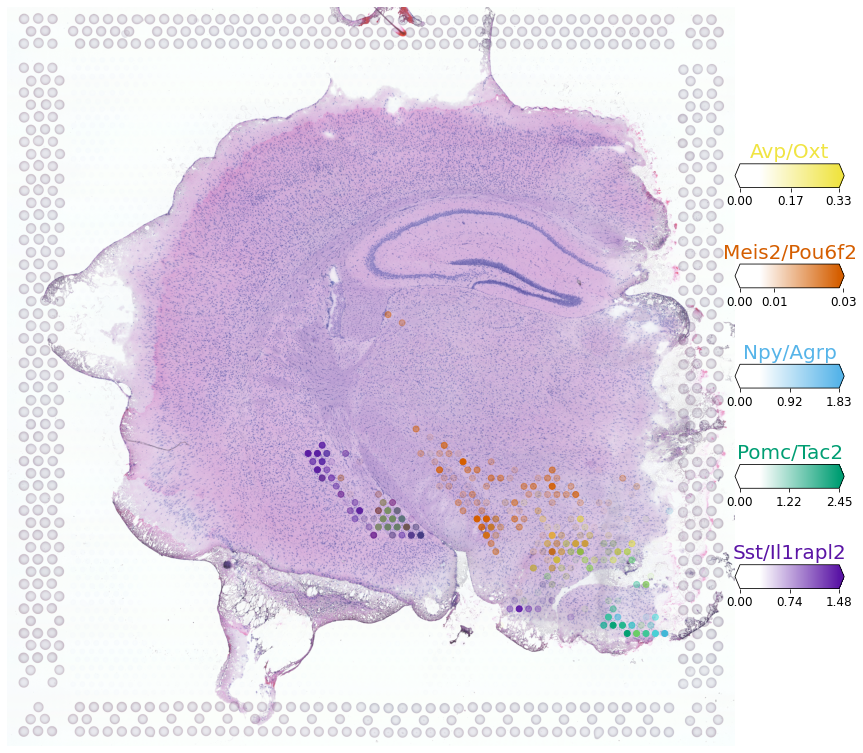

In [9]:
from cell2location.plt.mapping_video import plot_spatial

# select up to 6 clusters 
sel_clust = ['Avp/Oxt', 'Meis2/Pou6f2', 'Npy/Agrp', 'Pomc/Tac2', 'Sst/Il1rapl2']
sel_clust_col = ['q05_spot_factors' + str(i) for i in sel_clust]

slide = select_slide(adata_vis, 'ST8059049')

with mpl.rc_context({'figure.figsize': (15, 15)}):
    fig = plot_spatial(slide.obs[sel_clust_col], labels=sel_clust,
                  coords=slide.obsm['spatial'] \
                          * list(slide.uns['spatial'].values())[0]['scalefactors']['tissue_hires_scalef'], 
                  show_img=True, img_alpha=0.8,
                  style='fast', # fast or dark_background
                  img=list(slide.uns['spatial'].values())[0]['images']['hires'],
                  circle_diameter=6, colorbar_position='right')

Next, we show how to use the standard scanpy pipeline to plot cell locations over histology images (for more extensive information refer to scanpy):

## 3. Identifying tissue regions by clustering <a name="3.-Identifying-tissue-regions-by-clustering"></a>

We identify tissue regions that differ in their cell composition by clustering locations using cell abundance estimated by cell2location. 

We find tissue regions by clustering Visium spots using estimated cell abundance each cell type. We constuct a K-nearest neigbour (KNN) graph representing similarity of locations in estimated cell abundance and then apply Leiden clustering. The number of KNN neighbours should be adapted to size of dataset and the size of anatomically defined regions (e.i. hippocampus regions are rather small so could be masked by large `n_neighbors`). This can be done for a range KNN neighbours and Leiden clustering resolutions until a clustering matching the anatomical structure of the tissue is obtained. 

The clustering is done jointly across all Visium sections / batches, hence the region identities are directly comparable. When there are strong technical effects between multiple batches (not the case here) `sc.external.pp.bbknn` can be used to account for those effects during the KNN construction.

The resulting clusters are saved in `adata_vis.obs['region_cluster']`.

Trying to set attribute `.uns` of view, copying.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


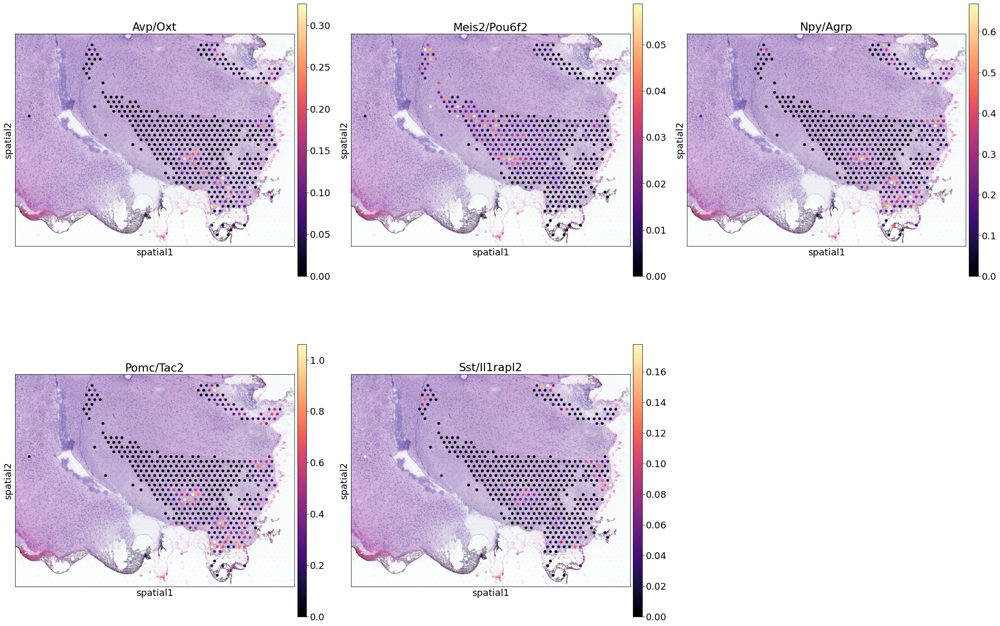

In [16]:
sel_clust = ['Avp/Oxt', 'Meis2/Pou6f2', 'Npy/Agrp', 'Pomc/Tac2', 'Sst/Il1rapl2']

sel_clust_col = ['q05_spot_factors' + str(i) for i in sel_clust]

# select one section correctly subsetting histology image data
slide = select_slide(adata_vis, 'ST8059050')

# plot with nice names
with mpl.rc_context({'figure.figsize': (10, 10), "font.size": 18}):
    # add slide.obs with nice names
    slide.obs[sel_clust] = (slide.obs[sel_clust_col])
    
    sc.pl.spatial(slide, cmap='magma',
                  color=sel_clust[0:6], # limit size in this notebook
                  ncols=3, 
                  size=0.8, img_key='hires', 
                  alpha_img=0.9,
                  vmin=0, vmax='p99.2'
                 )

Trying to set attribute `.uns` of view, copying.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


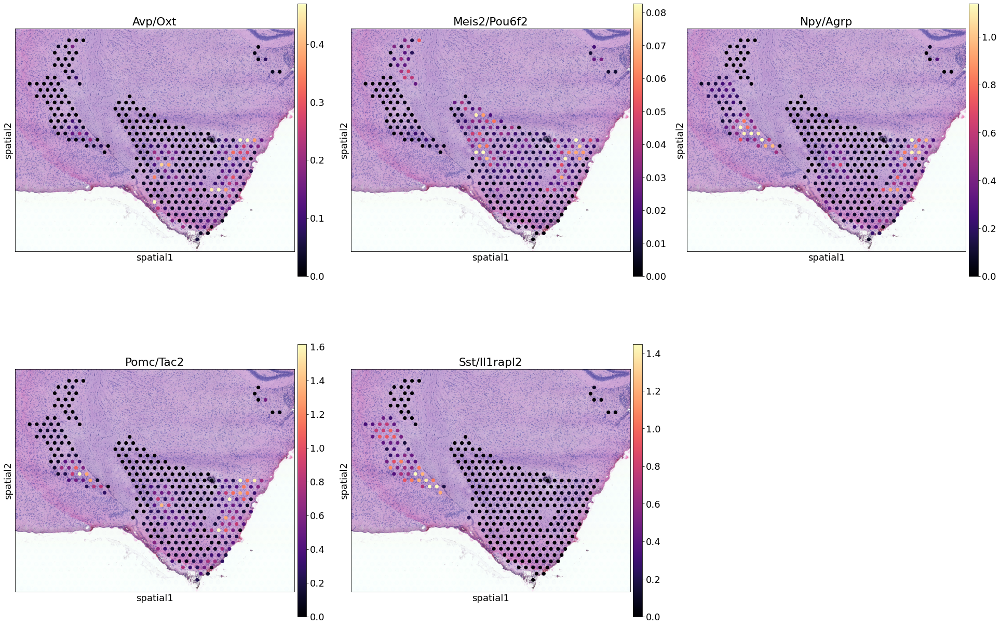

In [17]:
sel_clust = ['Avp/Oxt', 'Meis2/Pou6f2', 'Npy/Agrp', 'Pomc/Tac2', 'Sst/Il1rapl2']


sel_clust_col = ['q05_spot_factors' + str(i) for i in sel_clust]

# select one section correctly subsetting histology image data
slide = select_slide(adata_vis, 'ST8059051')

# plot with nice names
with mpl.rc_context({'figure.figsize': (10, 10), "font.size": 18}):
    # add slide.obs with nice names
    slide.obs[sel_clust] = (slide.obs[sel_clust_col])
    
    sc.pl.spatial(slide, cmap='magma',
                  color=sel_clust[0:6], # limit size in this notebook
                  ncols=3, 
                  size=0.8, img_key='hires', 
                  alpha_img=0.9,
                  vmin=0, vmax='p99.2'
                 )

Trying to set attribute `.uns` of view, copying.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


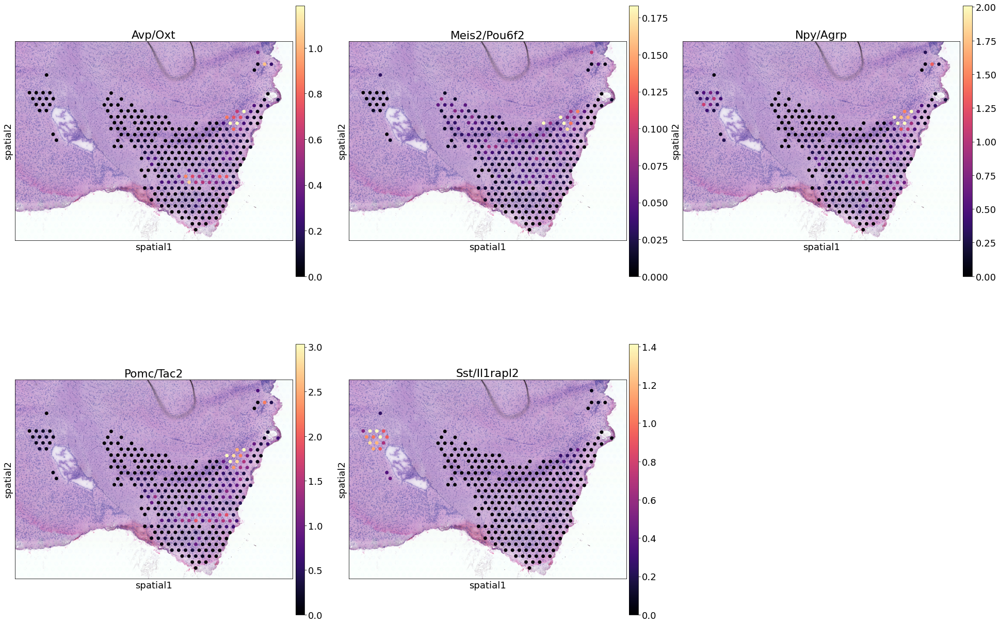

In [28]:
sel_clust = ['Avp/Oxt', 'Meis2/Pou6f2', 'Npy/Agrp', 'Pomc/Tac2', 'Sst/Il1rapl2']


sel_clust_col = ['q05_spot_factors' + str(i) for i in sel_clust]

# select one section correctly subsetting histology image data
slide = select_slide(adata_vis, 'ST8059052')

# plot with nice names
with mpl.rc_context({'figure.figsize': (10, 10), "font.size": 18}):
    # add slide.obs with nice names
    slide.obs[sel_clust] = (slide.obs[sel_clust_col])
    
    sc.pl.spatial(slide, cmap='magma',
                  color=sel_clust[0:6], # limit size in this notebook
                  ncols=3, 
                  size=0.8, img_key='hires', 
                  alpha_img=0.9,
                  vmin=0, vmax='p99.2'
                 )

In [20]:
sample_type = 'q05_nUMI_factors'
col_ind = [sample_type in i for i in adata_vis.obs.columns.tolist()]
adata_vis.obsm[sample_type] = adata_vis.obs.loc[:,col_ind].values

# compute KNN using the cell2location output
sc.pp.neighbors(adata_vis, use_rep=sample_type,
                n_neighbors = 10)

# Cluster spots into regions using scanpy
sc.tl.leiden(adata_vis, resolution=1)

# add region as categorical variable
adata_vis.obs["region_cluster"] = adata_vis.obs["leiden"]
adata_vis.obs["region_cluster"] =  adata_vis.obs["region_cluster"].astype("category")

#### Visualise the regions in UMAP based on cell abundances and in 2D

Here we use the same KNN graph representing similarity locations in terms of cell abundance to perform UMAP projection of all locations. We can see that cell2location successfully integrated the 2 sections. You can see that the regions with analogous position in the cortex (2D below) are composed out of spots coming from both samples (e.g. region cluster 14, 16, 0 - cortical layers L4, L5 and L6). 

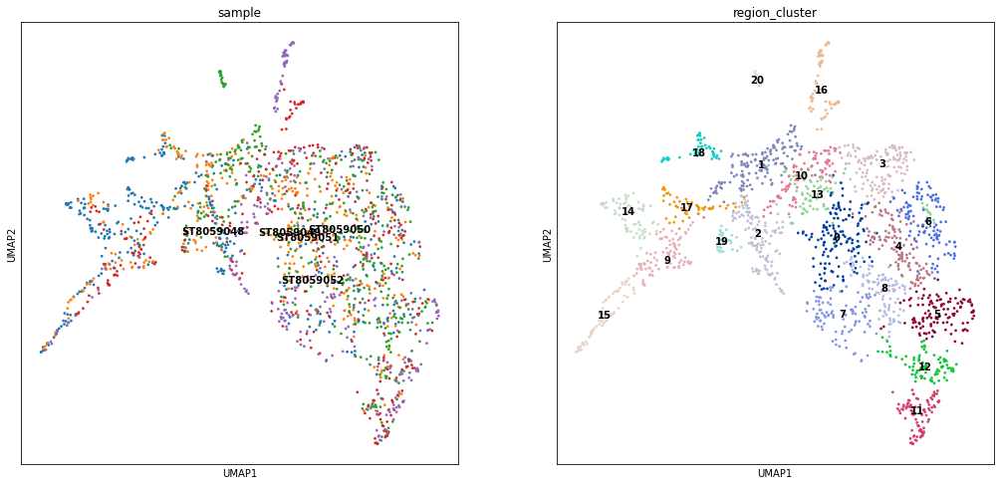

In [21]:
sc.tl.umap(adata_vis, min_dist = 0.3, spread = 1)

with mpl.rc_context({'figure.figsize': (8, 8)}):
    sc.pl.umap(adata_vis, color=['sample', 'region_cluster'], size=30,
               color_map = 'RdPu', ncols = 2, legend_loc='on data',
               legend_fontsize=10)

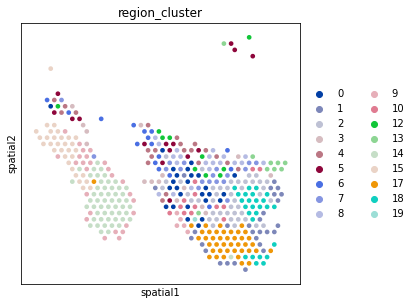

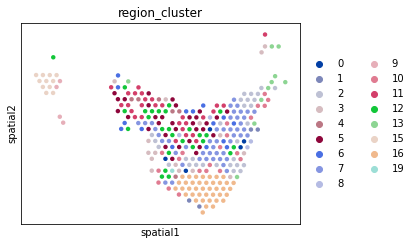

In [22]:
# Plot the region identity of each location in 2D space
# Plotting UMAP of integrated datasets before 2D plots of separate sections ensures 
# consistency of colour scheme via `adata_vis.uns['region_cluster_colors']`.
with mpl.rc_context({'figure.figsize': (5, 6)}):
    sc.pl.spatial(adata_vis[adata_vis.obs["sample"]=="ST8059048"],
                  library_id='spaceranger100_count_30458_ST8059048_mm10-3_0_0_premrna',
                  color=["region_cluster"], img_key=None
                );
    sc.pl.spatial(adata_vis[adata_vis.obs["sample"]=="ST8059052"],
                  library_id='spaceranger100_count_30458_ST8059052_mm10-3_0_0_premrna',
                  color=["region_cluster"], img_key=None
                )

#### Export regions for import to 10X Loupe Browser

Our region maps can be visualised over the histology image and explored interactively using the 10X Loupe Browser (please refer to 10X website for instructions).

In [8]:
# save maps for each sample separately
sam = np.array(adata_vis.obs['sample'])
for i in np.unique(sam):
    
    s1 = adata_vis.obs[['region_cluster']]
    s1 = s1.loc[sam == i]
    s1.index = [x[10:] for x in s1.index]
    s1.index.name = 'Barcode'
    
    s1.to_csv(results_folder +r['run_name']+'/region_cluster18_' + i + '.csv')

## 4. Identify groups of co-located cell types using matrix factorisation <a name="4.-Identify-groups-of-co-located-cell-types-using-matrix-factorisation"></a>

Here, we use estimated cell abundances as an input to non-negative matrix factorisation to identify groups of co-located cell types $R$, which can be interpreted as cellular compartments or tissue zones. See [paper section 4](https://www.biorxiv.org/content/10.1101/2020.11.15.378125v1) and Supplemenary Methods for details. Intuitively, we hypothesise that cell interactions can drive linear dependencies in cell type abundance, which can be estimated via NMF [Supplemenary Methods section 4.2](https://github.com/vitkl/cell2location_paper/blob/master/paper/Supplementary_Methods_cell2location.pdf). In addition, we observed that tissues with a high degree of spatial interlacing of cellular comparments such as the human lymph nodes are better described by NMF that by discrete clustering (see [paper Fig S16](https://www.biorxiv.org/content/10.1101/2020.11.15.378125v1.supplementary-material))


<div class="alert alert-block alert-primary">
<b>Tip</b>
If you want to find a few most disctinct cellular compartments, use a small number of factors.   
If you want to find very strong co-location signal and assume that most cell types don't co-locate, use a lot of factors (> 30 - used here).
In practice, it is better to train NMF for a range of factors $R={5, .., 30}$ and select $R$ as a balance between capturing fine tissue zones and splitting known compartments
</div>

Below we show how to perform this analysis. First, we initialise this model and train it several times to evaluate consitency of identified compartments.

In [5]:
# -*- coding: utf-8 -*-
r"""Co-located cell combination model - de-novo factorisation of cell type density using sklearn NMF."""

import matplotlib
import matplotlib.pyplot as plt
# +
import numpy as np
import pandas as pd

from cell2location.models.base.base_model import BaseModel


# defining the model itself
class CoLocatedGroupsSklearnNMF(BaseModel):
    r"""Co-located cell combination model - de-novo factorisation of cell type density using sklearn NMF.
    
    This model takes the absolute cell density inferred by cell2location as input
    to non-negative matrix factorisation to identify groups of cell types with similar locations or 'tissue zones'.
    
    If you want to find the most disctinct cell type combinations, use a small number of factors.
    
    If you want to find very strong co-location signal and assume that most cell types are on their own,
    use a lot of factors (> 30).
    
    To perform this analysis we initialise the model and train it several times to evaluate consitency.
    This class wraps around scikit-learn NMF to perform training, visualisation, export of the results.
    
    Note
    -----
        Factors are exchangeable so while you find factors with consistent cell type composition,
        every time you train the model you get those factors in a different order.
    
    This analysis is most revealing for tissues (such as lymph node) and cell types (such as glial cells)
    where signals between cell types mediate their location patterns.
    In the mouse brain locations of neurones are determined during development
    so most neurones stand alone in their location pattern.
    
    Density :math:`w_{sf}` of each cell type `f` across locations `s` is modelled as an additive function of
    the cell combinations (micro-environments) `r`. This means the density of one cell type in one location can
    be explained by 2 distinct combinations `r`.
    
    Cell type density is therefore a function of the following non-negative components:
    
    .. math::
        w_{sf} = \sum_{r} ({i_{sr} \: k_{rf} \: m_{f}})
    
    Components
      * :math:`k_{rf}` represents the proportion of cells of each type (regulatory programmes) `f` that correspond to each
        co-located combination `r`, normalised for total abundance of each cell type :math:`m_{f}`.
      * :math:`m_{f}` cell type budget accounts for the difference in abundance between cell types,
        thus focusing the interpretation of :math:`k_{rf}` on cell co-location.
      * :math:`i_{sr}` is proportional to the number of cells from each neighbourhood `r` in each location `s`,
        and shows the abundance of combinations `r` in locations `s`.
    
    In practice :math:`q_{rf} = k_{rf} \: m_{f}` is obtained from scikit-learn NMF and normalised by the sum across
    combinations `r` to obtain :math:`k_{rf}`:
    
    .. math::
        k_{rf} = q_{rf} / (\sum_{r} q_{rf})
    
    Note
    ----
        So, the model reports the proportion of cells of each type that belong to each combination
        (parameter called 'cell_type_fractions').
        For example, 81% of Astro_2 are found in fact_28.
        This way we account for the absolute abundance of each cell type.
    Parameters
    ----------
    n_fact :
        Maximum number of cell type groups, or factors
    X_data :
        Numpy array of the cell abundance (cols) in locations (rows)
    n_iter :
        number of training iterations
    verbose :
        var_names, var_names_read, obs_names, fact_names, sample_id: See parent class BaseModel for details.
    init, random_state, alpha, l1_ratio:
        arguments for sklearn.decomposition.NMF with sensible defaults see help(sklearn.decomposition.NMF) for more details
    nmf_kwd_args :
        dictionary with more keyword arguments for sklearn.decomposition.NMF
    """

    def __init__(
            self,
            n_fact: int,
            X_data: np.ndarray,
            n_iter=10000,
            verbose=True,
            var_names=None, var_names_read=None,
            obs_names=None, fact_names=None, sample_id=None,
            init='random', random_state=0, alpha=0.1, l1_ratio=0.5,
            nmf_kwd_args={}
    ):

        ############# Initialise parameters ################
        super().__init__(X_data, n_fact,
                         0, n_iter,
                         0, 0,
                         verbose, var_names, var_names_read,
                         obs_names, fact_names, sample_id)

        self.location_factors_df = None
        self.X_data_sample = None

        self.init = init
        self.random_state = random_state
        np.random.seed(random_state)
        self.alpha = alpha
        self.l1_ratio = l1_ratio
        self.nmf_kwd_args = nmf_kwd_args

    def fit(self, n=3, n_type='restart'):
        """Find parameters using sklearn.decomposition.NMF, optionally restart several times,
        and export parameters to self.samples['post_sample_means']
        Parameters
        ----------
        n :
            number of independent initialisations (Default value = 3)
        n_type :
            type of repeated initialisation:
            * 'restart' to pick different initial value,
            * 'cv' for molecular cross-validation - splits counts into n datasets,
              for now, only n=2 is implemented
            * 'bootstrap' for fitting the model to multiple downsampled datasets.
              Run `mod.bootstrap_data()` to generate variants of data (Default value = 'restart')
        Returns
        -------
        None
            exported parameters in self.samples['post_sample_means']
        """

        self.models = {}
        self.results = {}
        self.samples = {}

        self.n_type = n_type

        if np.isin(n_type, ['bootstrap']):
            if self.X_data_sample is None:
                self.bootstrap_data(n=n)
        elif np.isin(n_type, ['cv']):
            if self.X_data_sample is None:
                self.generate_cv_data()  # cv data added to self.X_data_sample

        init_names = ['init_' + str(i + 1) for i in np.arange(n)]

        for i, name in enumerate(init_names):

            # when type is molecular cross-validation or bootstrap, 
            # replace self.x_data with new data
            if np.isin(n_type, ['cv', 'bootstrap']):
                self.x_data = self.X_data_sample[i]
            else:
                self.x_data = self.X_data

            from sklearn.decomposition import NMF
            self.models[name] = NMF(n_components=self.n_fact, init=self.init,
                                    alpha=self.alpha, l1_ratio=self.l1_ratio,
                                    max_iter=self.n_iter, **self.nmf_kwd_args)
            W = self.models[name].fit_transform(self.x_data)
            H = self.models[name].components_
            self.results[name] = {'post_sample_means': {'location_factors': W,
                                                        'cell_type_factors': H.T,
                                                        'nUMI_factors': (W * H.T.sum(0))},
                                  'post_sample_sds': None,
                                  'post_sample_q05': None, 'post_sample_q95': None}
            self.samples = self.results[name]

            # plot training history
            if self.verbose:
                print(name + ' - iterations until convergence: ' + str(self.models[name].n_iter_));

    def evaluate_stability(self, node_name, align=True, n_samples=1000):
        """Evaluate stability of the solution between training initialisations
        (correlates the values of factors between training initialisations)
        Parameters
        ----------
        node_name :
            name of the parameter to evaluate, see `self.samples['post_sample_means'].keys()`
            Factors should be in columns.
        align :
            boolean, match factors between training restarts using linear_sum_assignment? (Default value = True)
        n_samples:
            does nothing, added to preserve call signature consistency with bayesian models
        Returns
        -------
        None
            plots comparing all training initialisations to initialisation 1.
        """

        n_plots = len(self.results.keys()) - 1
        ncol = int(np.min((n_plots, 3)))
        nrow = int(np.ceil(n_plots / ncol))
        for i in range(n_plots):
            plt.subplot(nrow, ncol, i + 1)
            self.align_plot_stability(self.results['init_' + str(1)]['post_sample_means'][node_name],
                                      self.results['init_' + str(i + 2)]['post_sample_means'][node_name],
                                      str(1), str(i + 2), align=align)

    def sample_posterior(self, node='all', n_samples=1000,
                         save_samples=False, return_samples=True,
                         mean_field_slot='init_1'):
        """This function does nothing but added to preserve call signature with future Bayesian versions of the model."""
        x = 1

    def compute_expected(self):
        """Compute expected abundance of each cell type in each location."""

        # compute the poisson rate
        self.mu = np.dot(self.samples['post_sample_means']['location_factors'],
                         self.samples['post_sample_means']['cell_type_factors'].T)

    def compute_expected_fact(self, fact_ind=None):
        """Compute expected abundance of each cell type in each location
        that comes from a subset of factors. E.g. expressed factors in self.fact_filt
        Parameters
        ----------
        fact_ind :
             (Default value = None)
        """

        if fact_ind is None:
            fact_ind = self.fact_filt

        # compute the poisson rate
        self.mu = np.dot(self.samples['post_sample_means']['location_factors'][:, fact_ind],
                         self.samples['post_sample_means']['cell_type_factors'].T[fact_ind, :])

    def plot_posterior_mu_vs_data(self, mu_node_name='mu', data_node='X_data'):
        """Plot expected value (of cell density) of the model against observed input data:
        2D histogram, where each point is each point in the input data matrix
        Parameters
        ----------
        mu_node_name :
            name of the object slot containing expected value (Default value = 'mu')
        data_node :
            name of the object slot containing data (Default value = 'X_data')
        """

        if type(mu_node_name) is str:
            mu = getattr(self, mu_node_name)
        else:
            mu = mu_node_name

        if type(data_node) is str:
            data_node = getattr(self, data_node)

        plt.hist2d(data_node.flatten(),
                   mu.flatten(),
                   bins=50, norm=matplotlib.colors.LogNorm())
        plt.xlabel('Data, values')
        plt.ylabel('Posterior sample, values')
        plt.title('UMI counts (all spots, all genes)')
        plt.tight_layout()

    def sample2df(self, node_name='nUMI_factors',
                  ct_node_name='cell_type_factors'):
        """Export cell combinations and their profile across locations as Pandas data frames.
        Parameters
        ----------
        node_name :
            name of the location loading model parameter to be exported (Default value = 'nUMI_factors')
        ct_node_name :
            name of the cell_type loadings model parameter to be exported (Default value = 'cell_type_factors')
        Returns
        -------
        None
            8 Pandas dataframes added to model object:
            .cell_type_loadings, .cell_factors_sd, .cell_factors_q05, .cell_factors_q95
            .gene_loadings, .gene_loadings_sd, .gene_loadings_q05, .gene_loadings_q95
        """

        # export location factors
        self.location_factors_df = \
            pd.DataFrame.from_records(self.samples['post_sample_means'][node_name],
                                      index=self.obs_names,
                                      columns=['mean_' + node_name + i for i in self.fact_names])

        self.cell_type_loadings = \
            pd.DataFrame.from_records(self.samples['post_sample_means'][ct_node_name],
                                      index=self.var_names,
                                      columns=['mean_' + ct_node_name + i for i in self.fact_names])

        self.cell_type_fractions = (self.cell_type_loadings.T / self.cell_type_loadings.sum(1)).T

        self.cell_type_loadings_sd = None
        self.cell_type_loadings_q05 = None
        self.cell_type_loadings_q95 = None


    def annotate_adata(self, adata):
        """Add location loadings to anndata.obs
        Parameters
        ----------
        adata :
            anndata object to annotate
        Returns
        -------
        anndata object
            updated anndata object
        """

        if self.location_factors_df is None:
            self.sample2df()

        # location factors
        # add location factors to adata
        adata.obs[self.location_factors_df.columns] = self.location_factors_df.loc[adata.obs.index, :]

        return adata

init_1 - iterations until convergence: 1824
init_2 - iterations until convergence: 1137
init_3 - iterations until convergence: 1466
init_4 - iterations until convergence: 1691
init_5 - iterations until convergence: 1857


,top-1,top-2,top-3,top-4,top-5,top-6,top-7,top-8,top-9,top-10
mean_cell_type_factorsfact_0,Celf2/Phactr1: 0.83,Sgcd/Tac1: 0.52,Sst/Npy: 0.27,Satb2/Rab3b: 0.21,Macrophage: 0.18,Pdzrn4/Kcnq5: 0.14,Slit3/Cacna2d1: 0.14,Nrg1/Nnat: 0.11,OPC: 0.1,Tanycyte: 0.073
mean_cell_type_factorsfact_1,Npas3/Gm32647: 0.91,Kcnmb2/Hs3st4: 0.24,Pericyte: 0.13,Microglia: 0.064,Oligodendrocyte: 0.056,Dgkb/B230323A14Rik: 0.025,Astrocyte: 0.02,Meis2/Pou6f2: 0.016,Chrm3/Schip1: 0.015,Nrxn3/Sox2ot: 0.0044
mean_cell_type_factorsfact_2,Tanycyte: 0.77,Macrophage: 0.36,OPC: 0.18,Sgcd/Tac1: 0.12,Sst/Npy: 0.07,Endothelial Cell: 0.061,Crh/Gpc5: 0.0092,Nrg1/Nnat: 0.0061,Sox2ot/Gal: 0.005,Satb2/Rab3b: 0.0048
mean_cell_type_factorsfact_3,Slit3/Cacna2d1: 0.81,Pdzrn4/Kcnq5: 0.49,Sst/Npy: 0.24,Celf2/Phactr1: 0.15,Neuron: 0.12,Satb2/Rab3b: 0.12,Sgcd/Tac1: 0.11,Nrg1/Nnat: 0.068,Pard3b/Tac1: 0.066,Crh/Gpc5: 0.051
mean_cell_type_factorsfact_4,Neuron: 0.44,Nrxn3/Sox2ot: 0.08,Nfib/Tcf4: 0.078,Meis2/Pou6f2: 0.068,Gal/Nts: 0.051,1700042O10Rik/Ddc: 0.042,Avp/Oxt: 0.035,Sgcd/Tac1: 0.033,Trh/Gpc5: 0.029,Npsr1/Unc13c: 0.028
mean_cell_type_factorsfact_5,Rgs6/B230323A14Rik: 0.93,Slc1a3/Apoe: 0.22,Endothelial Cell: 0.053,Astrocyte: 0.039,Oligodendrocyte: 0.017,Tafa1/Pcdh11x: 0.011,Nrg1/Nnat: 0.011,Avp/Oxt: 0.011,OPC: 0.0093,Dgkb/B230323A14Rik: 0.0071
mean_cell_type_factorsfact_6,Astrocyte: 0.6,Pericyte: 0.19,Microglia: 0.18,Slc1a3/Apoe: 0.17,Apoe/Atp1a2: 0.16,Endothelial Cell: 0.15,OPC: 0.15,Macrophage: 0.043,Rnf220/Ntng1: 0.031,Oligodendrocyte: 0.027
mean_cell_type_factorsfact_7,Ependymocyte: 0.96,Pericyte: 0.069,Tanycyte: 0.053,Nrg1/Nnat: 0.051,Avp/Oxt: 0.051,Rfx4/Hcrt: 0.03,Cartpt/Ebf1: 0.024,Pomc/Tac2: 0.023,1700042O10Rik/Ddc: 0.022,Crh/Gpc5: 0.02
mean_cell_type_factorsfact_8,Tcf4/Ebf1: 0.95,1700042O10Rik/Ddc: 0.51,Avp/Oxt: 0.36,Chrm3/Schip1: 0.33,Tafa1/Pcdh11x: 0.33,Trh/Gpc5: 0.28,Meis2/Pou6f2: 0.26,Nfib/Tcf4: 0.24,Nrxn3/Sox2ot: 0.21,Gal/Nts: 0.2
mean_cell_type_factorsfact_9,Synpr/Tafa1: 0.82,Slc1a3/Apoe: 0.056,Tafa1/Pcdh11x: 0.035,Chrm3/Schip1: 0.032,Sox2ot/Gal: 0.03,Pard3b/Tac1: 0.022,Trh/Gpc5: 0.022,Astrocyte: 0.021,Cartpt/Pmch: 0.02,Pomc/Tac2: 0.014


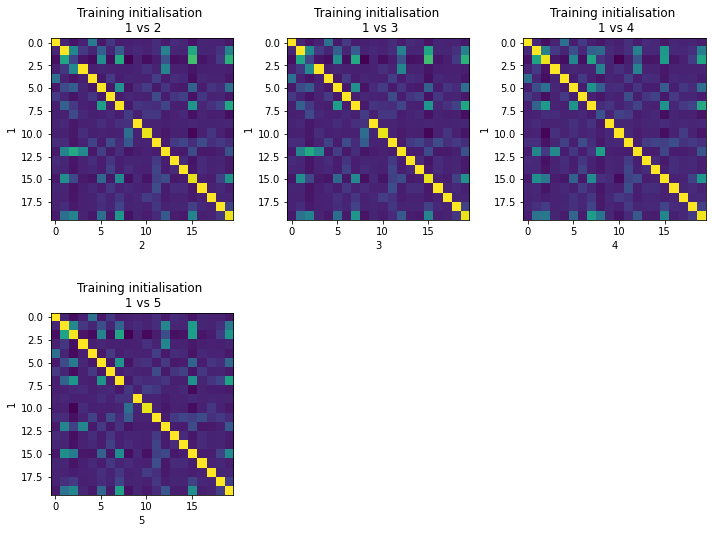

In [6]:
# number of cell type combinations - educated guess assuming that most cell types don't co-locate
n_fact = int(20)

# extract cell abundance from cell2location
X_data = adata_vis.uns['mod']['post_sample_q05']['spot_factors']

import cell2location.models as c2l
# create model class
mod_sk = CoLocatedGroupsSklearnNMF(n_fact, X_data, 
        n_iter = 10000,
        verbose = True,
        var_names=adata_vis.uns['mod']['fact_names'],
        obs_names=adata_vis.obs_names,
        fact_names=['fact_' + str(i) for i in range(n_fact)],
        sample_id=adata_vis.obs['sample'],
        init='random', random_state=0,
        nmf_kwd_args={'tol':0.0001})

# train 5 times to evaluate stability
mod_sk.fit(n=5, n_type='restart') 

## Do some diagnostics
# evaluate stability by comparing trainin restarts

with mpl.rc_context({'figure.figsize': (10, 8)}):
    mod_sk.evaluate_stability('cell_type_factors', align=True)

# extract parameters into DataFrames
mod_sk.sample2df(node_name='nUMI_factors', ct_node_name = 'cell_type_factors')

# export results to scanpy object
adata_vis = mod_sk.annotate_adata(adata_vis) # as columns to .obs
adata_vis = mod_sk.export2adata(adata_vis, slot_name='mod_sklearn') # as a slot in .uns

# print the fraction of cells of each type located to each combination
mod_sk.print_gene_loadings(loadings_attr='cell_type_fractions',
                         gene_fact_name='cell_type_fractions')

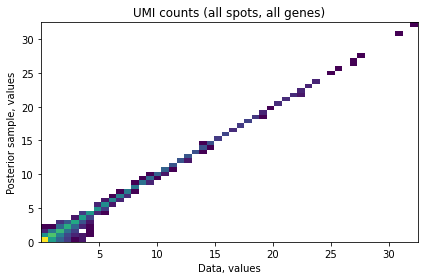

In [7]:
mod_sk.compute_expected()
mod_sk.plot_posterior_mu_vs_data()

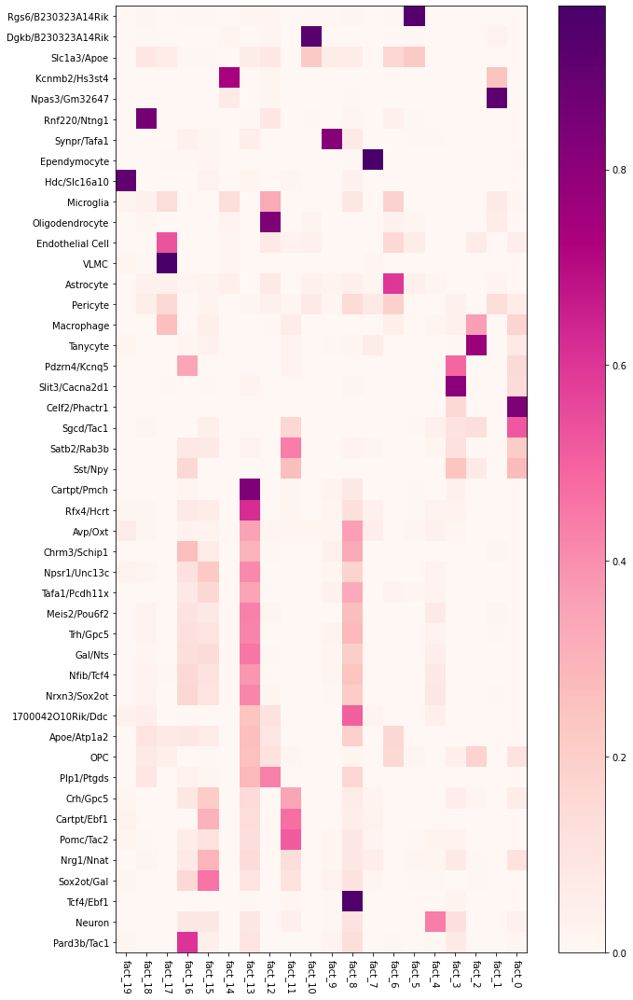

In [8]:
# make nice names
from re import sub
mod_sk.cell_type_fractions.columns = [sub('mean_cell_type_factors', '', i) 
                                      for i in mod_sk.cell_type_fractions.columns]

# plot co-occuring cell type combinations
mod_sk.plot_gene_loadings(mod_sk.var_names_read, mod_sk.var_names_read,
                        fact_filt=mod_sk.fact_filt,
                        loadings_attr='cell_type_fractions',
                        gene_fact_name='cell_type_fractions',
                        cmap='RdPu', figsize=[10, 15])

In [9]:
factor_name =['fact_11', 'fact_15', 'fact_8','fact_4', 'fact_16', 
              'fact_13', 'fact_3', 'fact_0','fact_6', 'fact_5',
              'fact_10','fact_12', 'fact_18','fact_14','fact_1', 
              'fact_17', 'fact_7', 'fact_2', 'fact_19','fact_9']

In [10]:
sel =  ['Apoe/Atp1a2', 'Meis2/Pou6f2', 'Trh/Gpc5', 'Npsr1/Unc13c', 'Gal/Nts', 'Nfib/Tcf4',  'Nrxn3/Sox2ot', 'Avp/Oxt', 'Tafa1/Pcdh11x',

 'Cartpt/Ebf1','Pomc/Tac2', 'Crh/Gpc5', 'Nrg1/Nnat', 'Sox2ot/Gal',

 'Plp1/Ptgds', 'Chrm3/Schip1','1700042O10Rik/Ddc',  'Tcf4/Ebf1',

 'Neuron','Pard3b/Tac1', 'Cartpt/Pmch', 'Rfx4/Hcrt','Pdzrn4/Kcnq5', 'Slit3/Cacna2d1', 'Satb2/Rab3b','Sst/Npy', 'Celf2/Phactr1', 'Sgcd/Tac1','Endothelial Cell',  'Pericyte','Astrocyte',

'Rgs6/B230323A14Rik',
'Dgkb/B230323A14Rik', 'Slc1a3/Apoe', 'Oligodendrocyte','Rnf220/Ntng1',

 'Kcnmb2/Hs3st4','Npas3/Gm32647', 'Microglia',  'OPC','VLMC',  'Ependymocyte', 'Macrophage', 'Tanycyte','Hdc/Slc16a10', 'Synpr/Tafa1']


In [11]:
from matplotlib import rcParams
from cell2location.plt.plot_heatmap import clustermap

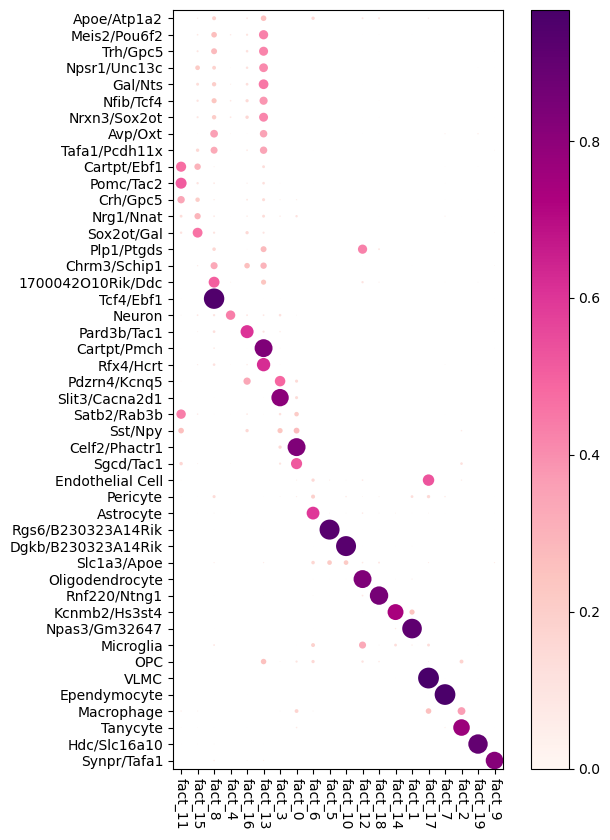

In [13]:
matplotlib.rc_file_defaults()
rcParams['pdf.fonttype'] = 42 # enables correct plotting of text
clustermap(mod_sk.cell_type_fractions.loc[sel, factor_name[::-1]],
           cluster_rows=False, cluster_cols=False,  
           figure_size=[4 + 0.12 * mod_sk.n_fact, 3.5 + 0.1 *50], array_size=None,
          fun_type='dotplot')

plt.savefig('NMF_20_dotplot.pdf', dpi = 1400)

In [14]:
mean_fact = ['mean_nUMI_factorsfact_11', 'mean_nUMI_factorsfact_15', 'mean_nUMI_factorsfact_8','mean_nUMI_factorsfact_4', 'mean_nUMI_factorsfact_16', 
              'mean_nUMI_factorsfact_13', 'mean_nUMI_factorsfact_3', 'mean_nUMI_factorsfact_0','mean_nUMI_factorsfact_6', 'mean_nUMI_factorsfact_5',
              'mean_nUMI_factorsfact_10','mean_nUMI_factorsfact_12', 'mean_nUMI_factorsfact_18','mean_nUMI_factorsfact_14','mean_nUMI_factorsfact_1', 
              'mean_nUMI_factorsfact_17', 'mean_nUMI_factorsfact_7', 'mean_nUMI_factorsfact_2', 'mean_nUMI_factorsfact_19','mean_nUMI_factorsfact_9']

Trying to set attribute `.uns` of view, copying.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


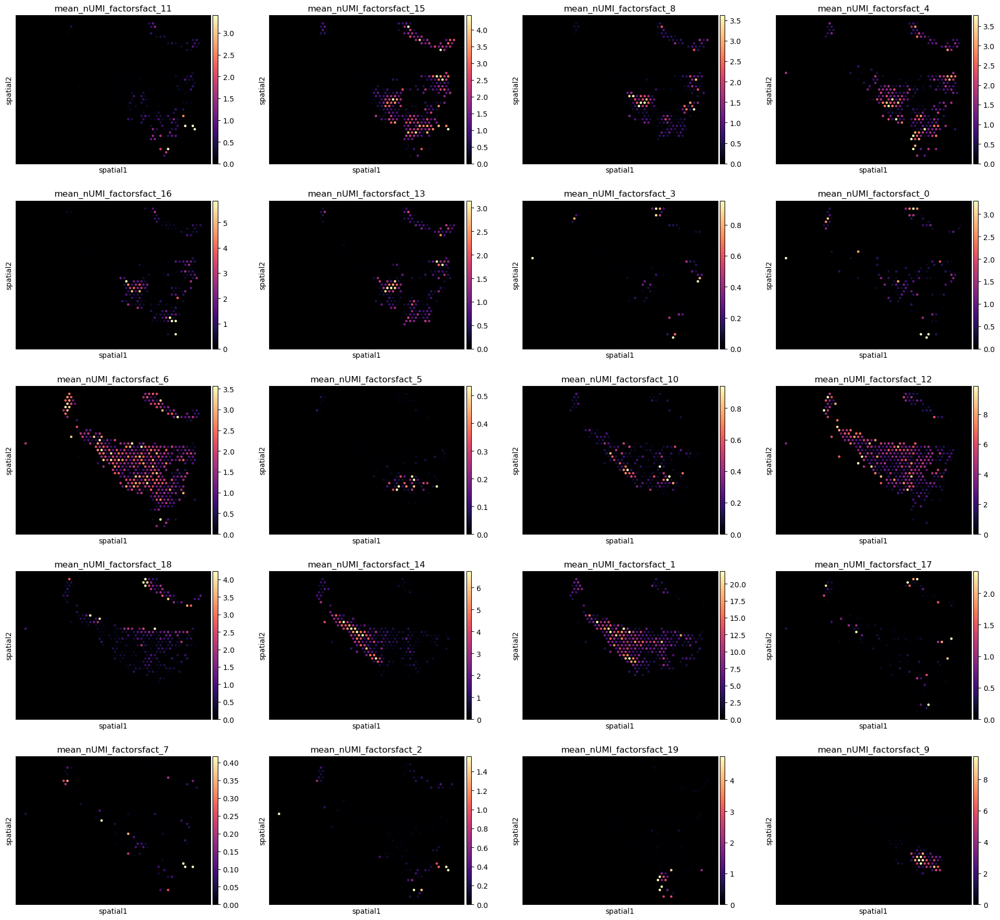

In [20]:
# plot cell density in each combination
with mpl.rc_context({'figure.figsize': (5, 4), 'axes.facecolor': 'black'}):
    
    # select one section correctly subsetting histology image data
    slide = select_slide(adata_vis, 'ST8059050')
    
    sc.pl.spatial(slide,
                  cmap='magma',
                  color=mean_fact,
                  ncols=4, 
                  size=1, img_key='hires', 
                  alpha_img=0,
                  vmin=0, vmax='p99.2',
                  save = 'NMF_20_slide_050.pdf')


Now we save the NMF model object to work with later (rememeber, every time you train the model, factors with the same composition will have a different order):

In [16]:
# save co-location models object
def pickle_model(mod, path, file_suffix=''):
    file = path + 'model_' + str(mod.__class__.__name__) + '_' + str(mod.n_fact) + '_' + file_suffix + ".p"
    pickle.dump({'mod': mod, 'fact_names': mod.fact_names}, file = open(file, "wb"))
    print(file)
    
pickle_model(mod_sk, results_folder +r['run_name'] + '/', file_suffix='')

./results/mouse_brain_snrna/LocationModelLinearDependentWMultiExperiment_5experiments_46clusters_1866locations_14142genes/model_CoLocatedGroupsSklearnNMF_20_.p


### It is often useful to train NMF for a range of factors $R$ to select most meaningful cell type groups

To aid this analysis, we wrapped the analysis shown above into a pipeline that automates training the NMF model with varying number of factors (including export of the same plots and data as shown above).

```python
from cell2location import run_colocation
res_dict, adata_vis = run_colocation(
                   adata_vis, model_name='CoLocatedGroupsSklearnNMF',
                   verbose=False, return_all=True,
    
                   train_args={
                    'n_fact': np.arange(10, 40), # IMPORTANT: range of number of factors (10-40 here)
                    'n_iter': 20000, # maximum number of training iterations
                       
                    'sample_name_col': 'sample', # columns in adata_vis.obs that identifies sample
                       
                    'mode': 'normal',
                    'n_type': 'restart', 'n_restarts': 5 # number of training restarts
                   },
    
                   model_kwargs={'init': 'random', 'random_state': 0, 'nmf_kwd_args': {'tol': 0.00001}},
    
                   posterior_args={},
                   export_args={'path': results_folder + 'std_model/'+r['run_name']+'/CoLocatedComb/',
                                'run_name_suffix': ''}) 
```

## Pearson correlation of cell types between snRNAseq and spatial inferred data and their heatmaps <a name="5.-Pearson-correlation"></a>



### using cell abundance and mRNA expression data

In [24]:
from cell2location.plt.plot_heatmap import clustermap
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

In [26]:
reg_mod_name = 'RegressionGeneBackgroundCoverageTorch_54covariates_40064cells_14795genes'
reg_path = f'{results_folder}regression_model/{reg_mod_name}/'
## snRNAseq reference (raw counts)
adata_snrna_raw = sc.read(f'{reg_path}sc.h5ad')

In [28]:
lay = pd.DataFrame(adata_snrna_raw.obs.loc[:, 'group'].value_counts(), 
                   index=adata_snrna_raw.obs['group'].unique())
lay = lay / lay.sum(0)

In [29]:
def abun_dist(slide, post_type = 'mean_spot_factors'):
    from re import sub

    sel_clust_col = [post_type in i for i in slide.obs.columns]
    sel_clust_col = slide.obs.columns[sel_clust_col]
    sel_clust = [sub(post_type, '', i) for i in sel_clust_col]

    infer_lay_df = slide.obs[sel_clust_col]
    infer_lay_df.columns = sel_clust
    infer_lay = pd.DataFrame(index=sel_clust)

    infer_lay = pd.DataFrame(np.mean(infer_lay_df.loc[:, :], axis=0), index = sel_clust)

    infer_lay = infer_lay / infer_lay.sum(0)
    
    return infer_lay

Variable names are not unique. To make them unique, call `.var_names_make_unique`.


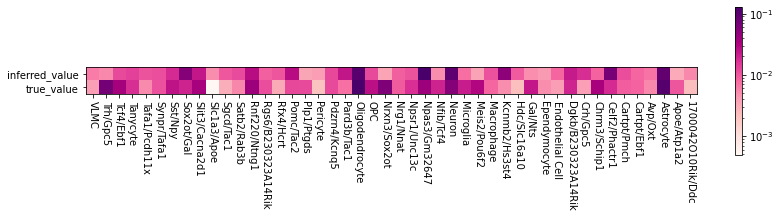

In [30]:
infer_lay_all = abun_dist(adata_vis.copy())
abd_heatmap_all = pd.concat([infer_lay_all,lay], axis = 1)

abd_heatmap_all.columns = ['inferred_value', 'true_value']
clustermap(abd_heatmap_all.T, figure_size=(12, 3), 
               cmap='RdPu', log=True,
               cluster_rows=False, cluster_cols=False)

In [31]:
# load the hippocampi spatial mapping result
hippo_data = pd.read_csv('hippo_heatmap_20210819.csv')

In [32]:
hippo_data = hippo_data.set_index("Unnamed: 0")
abd_heatmap = pd.concat([infer_lay_all,hippo_data], axis = 1)

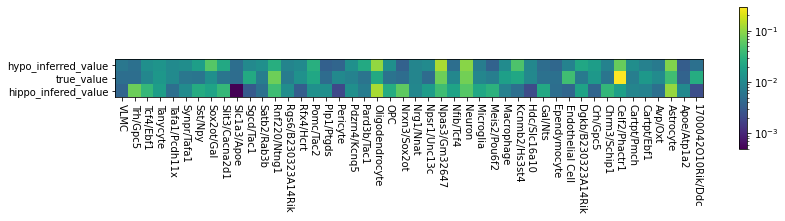

In [33]:
abd_heatmap.columns = ['hypo_inferred_value', 'true_value','hippo_infered_value']
clustermap(abd_heatmap.T, figure_size=(12, 3), 
               cmap='viridis', log=True,
               cluster_rows=False, cluster_cols=False)

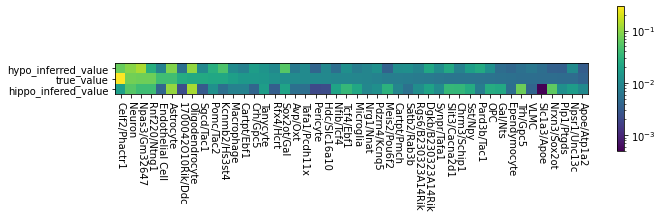

In [34]:
a = abd_heatmap.sort_values(by=['true_value'], ascending=True)
a = abd_heatmap.copy()
clustermap(a.sort_values(by=['true_value'], ascending=True).T, figure_size=(10, 3), 
               cmap='viridis', log=True,
               cluster_rows=False, cluster_cols=False)

# plt.savefig('cor_hypo_hip.pdf', dpi = 1200)

Trying to set attribute `.uns` of view, copying.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Trying to set attribute `.uns` of view, copying.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Trying to set attribute `.uns` of view, copying.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Trying to set attribute `.uns` of view, copying.
Variable names are not unique. To make them unique, call 

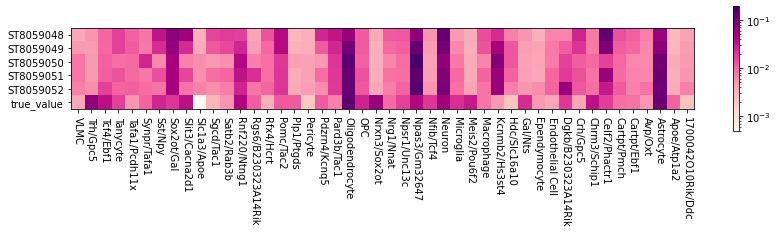

In [44]:
infer_lay_sep = pd.DataFrame()
for i in adata_vis.obs['sample'].unique():
    infer_lay_sep[i] = abun_dist(select_slide(adata_vis, i).copy())
    
lay.columns = ['true_value']
abd_heatmap_sep = pd.concat([infer_lay_sep, lay], axis = 1)

clustermap(abd_heatmap_sep.T, figure_size=(12, 3), 
               cmap='RdPu', log=True,
               cluster_rows=False, cluster_cols=False)

In [36]:
def plot_hist2d(x, y, xlab, ylab, log=False, scatter_kwdargs:dict={}):
    
    corr = np.corrcoef(
        x.values.flatten(), 
        y.values.flatten())[0,1]
    corr_log10 = np.corrcoef(
        np.log10(x.values.flatten() + 1), 
        np.log10(y.values.flatten() + 1))[0,1]

    if log:
        x = np.log10(x.values.flatten() + 1)
        y = np.log10(y.values.flatten() + 1)
        
        xlab = xlab + ' (log10)'
        ylab = ylab + ' (log10)'
    else:
        x = x.values.flatten()
        y = y.values.flatten()

    #plt.hist2d(x, y, bins=35, norm=matplotlib.colors.LogNorm());
    plt.scatter(x, y, **scatter_kwdargs);
    plt.xlabel(xlab);
    plt.ylabel(ylab);
    plt.xlim(0);
    plt.ylim(0);
    plt.title(r'$R^2$: ' \
              + str(np.round(corr, 3))\
              #+ r', $R^2$ log: '+ str(np.round(corr_log10, 3))
             );

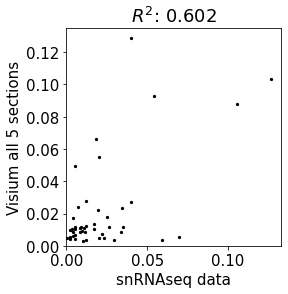

In [37]:
with matplotlib.rc_context({'axes.facecolor': 'white', 'font.size': 15,
                            'figure.figsize': [4, 4]}):
    
    plot_hist2d(lay, infer_lay_all, 
                'snRNAseq data', 
                'Visium all 5 sections', 
               scatter_kwdargs={'s': 5, 'c': 'black'})
    plt.gca().set_aspect('equal', adjustable='box')
    plt.savefig('correlation.pdf', bbox_inches='tight')
    plt.show()

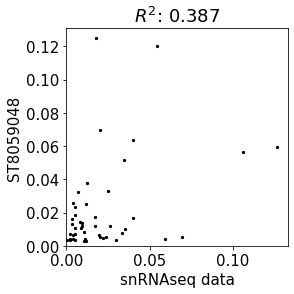

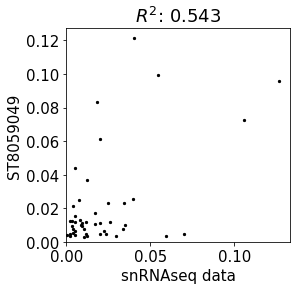

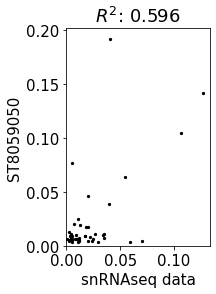

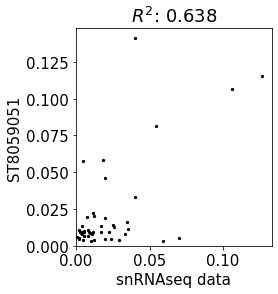

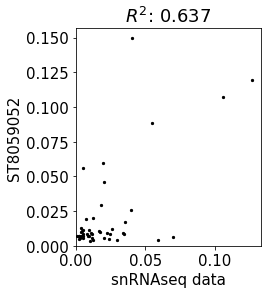

In [38]:
for i in adata_vis.obs['sample'].unique():
    with matplotlib.rc_context({'axes.facecolor': 'white', 'font.size': 15,
                            'figure.figsize': [4, 4]}):
        plot_hist2d(lay, infer_lay_sep[i], 
                    'snRNAseq data', 
                    i, 
                   scatter_kwdargs={'s': 5, 'c': 'black'})
        plt.gca().set_aspect('equal', adjustable='box')
        plt.savefig('correlation_separate_slides.pdf', bbox_inches='tight')
    
        plt.show()

to try more distance metrics, check https://docs.scipy.org/doc/scipy/reference/generated/scipy.spatial.distance.cdist.html#scipy.spatial.distance.cdist

to check the nUMI correlation:

Variable names are not unique. To make them unique, call `.var_names_make_unique`.


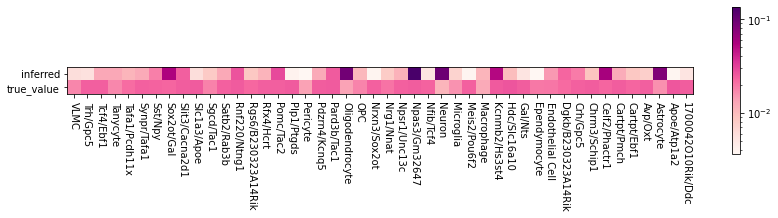

In [45]:
infer_nUMI_all = abun_dist(adata_vis.copy(), post_type = 'mean_nUMI_factors')
infer_nUMI_all.columns = ['inferred']
infer_nUMI_all = infer_nUMI_all.iloc[0:46,]

true_nUMI_all = inf_aver / inf_aver.sum(0)

nUMI_heatmap_rel = pd.concat([infer_nUMI_all, true_nUMI_all], axis = 1)
clustermap(nUMI_heatmap_rel.T, figure_size=(12, 3), 
               cmap='RdPu', log=True,
               cluster_rows=False, cluster_cols=False)

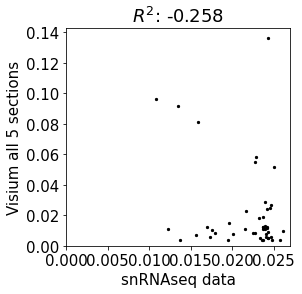

In [47]:
with matplotlib.rc_context({'axes.facecolor': 'white', 'font.size': 15,
                            'figure.figsize': [4, 4]}):
    
    plot_hist2d(true_nUMI_all, infer_nUMI_all, 
                'snRNAseq data', 
                'Visium all 5 sections', 
               scatter_kwdargs={'s': 5, 'c': 'black'})

## Export results

Save resulting anndata object that now include region clustering and co-located cell type groups.

In [127]:
adata_file = results_folder +r['run_name']+'/sp_with_clusters.h5ad'
adata_vis.write(adata_file)
adata_file

'./results/mouse_brain_snrna/LocationModelLinearDependentWMultiExperiment_2experiments_59clusters_5563locations_12809genes/sp_with_clusters.h5ad'

Modules and their versions used for this analysis

In [128]:
import sys
for module in sys.modules:
    try:
        print(module,sys.modules[module].__version__)
    except:
        try:
            if  type(sys.modules[module].version) is str:
                print(module,sys.modules[module].version)
            else:
                print(module,sys.modules[module].version())
        except:
            try:
                print(module,sys.modules[module].VERSION)
            except:
                pass


sys 3.7.10 | packaged by conda-forge | (default, Feb 19 2021, 16:07:37) 
[GCC 9.3.0]
ipykernel 6.0.1
ipykernel._version 6.0.1
json 2.0.9
re 2.2.1
IPython 7.25.0
IPython.core.release 7.25.0
logging 0.5.1.2
zlib 1.0
traitlets 5.0.5
traitlets._version 5.0.5
argparse 1.1
ipython_genutils 0.2.0
ipython_genutils._version 0.2.0
platform 1.0.8
IPython.core.crashhandler 7.25.0
pygments 2.9.0
pexpect 4.8.0
ptyprocess 0.7.0
decorator 5.0.9
pickleshare 0.7.5
backcall 0.2.0
sqlite3 2.6.0
sqlite3.dbapi2 2.6.0
_sqlite3 2.6.0
prompt_toolkit 3.0.19
wcwidth 0.2.5
jedi 0.18.0
parso 0.8.2
colorama 0.4.4
ctypes 1.1.0
_ctypes 1.1.0
IPython.core.magics.code 7.25.0
urllib.request 3.7
jupyter_client 6.1.12
jupyter_client._version 6.1.12
zmq 22.1.0
zmq.backend.cython 40304
zmq.backend.cython.constants 40304
zmq.sugar 22.1.0
zmq.sugar.constants 40304
zmq.sugar.version 22.1.0
jupyter_core 4.7.1
jupyter_core.version 4.7.1
tornado 6.1
_curses b'2.2'
dateutil 2.8.1
dateutil._version 2.8.1
six 1.16.0
decimal 1.70
_de